## Ejercicio 6

Genere un video en un patio o en un hall de edificio donde en un principio se vea vacío y luego aparezca una persona. Mediante los métodos de motion detection (sin usar deep learning) logre una detección de la persona cuando entra al cuadro suponiendo la utilidad para una cámara de seguridad. 
Luego sobre el mismo video aplique los algoritmos de flujo denso y disperso que se mostraron en clase. 
Escriba una reflexión sobre los resultados en el formato md dentro del Jupyter Notebook.

Alumno: Garcia, Timoteo 
Legajo: G-5891/2

In [1]:
!pip install -q mediapy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 9.6 MB/s eta 0:00:00


In [3]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import mediapy as media

In [2]:
url = "video.mp4"

In [4]:
video = media.read_video(url)
media.show_video(video)

In [5]:
# Función para oscurecer una imagen:
def process_image(new_image, prev_image, **kwargs):
    # Convertir la imagen a float32
    new_image_float = new_image.astype(np.float32)

    # Reducir el brillo de la imagen a la mitad
    new_image_float *= 0.5

    # Convertir la imagen de vuelta a uint8
    new_image_uint8 = np.clip(new_image_float, 0, 255).astype(np.uint8)

    return new_image_uint8

def draw_contours(frame, contours, color=(0, 255, 0), thickness=2):
    # Comprobar si la imagen es en escala de grises (1 canal)
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        # Convertir la imagen de escala de grises a color (3 canales)
        result_image = cv2.cvtColor(frame, cv2.COLOR_GRAY2BGR)
    else:
        # Si ya es una imagen de color, simplemente hacer una copia
        result_image = frame.copy()

    # Dibujar cada contorno en la imagen
    for contour in contours:
        # Obtener el rectángulo delimitador para cada contorno
        x, y, w, h = cv2.boundingRect(contour)
        # Dibujar el rectángulo
        cv2.rectangle(result_image, (x, y), (x + w, y + h), color, thickness)

    return result_image

# Función para procesar un video:
def video_processor(filename_in, filename_out, process_func, max_time=10, **kwargs):
    # Abrir el video de entrada para lectura
    with media.VideoReader(filename_in) as r:
        # Crear un archivo de video de salida
        with media.VideoWriter(filename_out, shape=r.shape, fps=r.fps, bps=r.bps) as w:
            count = 0  # Inicializar contador de fotogramas
            prev_image = None  # Inicializar la imagen previa

            # Iterar sobre cada imagen (fotograma) del video
            for image in r:
                new_image = media.to_uint8(image)  # Convertir la imagen a formato flotante

                # Comprobar si es la primera imagen
                if prev_image is None:
                    prev_image = new_image.copy()

                # Procesar la imagen utilizando la función dada
                processed_image = process_func(new_image, prev_image, **kwargs)

                # Añadir la imagen procesada al video de salida
                w.add_image(processed_image)

                # Actualizar la imagen previa
                prev_image = new_image.copy()

                # Incrementar el contador de fotogramas
                count += 1

                # Detener el proceso si se alcanza el tiempo máximo
                if count >= max_time * r.fps:
                    break
def process_frame_difference(new_image, prev_image, **kwargs):
    # Convertir las imágenes a escala de grises
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY)
    prev_gray = cv2.cvtColor(prev_image, cv2.COLOR_RGB2GRAY)

    # Calcular la diferencia absoluta entre los fotogramas actual y anterior
    frame_diff = cv2.absdiff(new_gray, prev_gray)

    # Normalizar la imagen de diferencia
    norm_diff = cv2.normalize(frame_diff, None, 0, 255, cv2.NORM_MINMAX)

    # Umbralizar la imagen para resaltar las diferencias
    _, thresh = cv2.threshold(norm_diff, 20, 255, cv2.THRESH_BINARY)

    # Convertir la imagen umbralizada a color para mantener la consistencia con el video original
    thresh_color = cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB)

    return thresh_color

In [21]:
# Función actualizada para detectar movimientos y dibujar cuadros delimitadores:
def process_frame_difference_full(new_image, prev_image, **kwargs):
    # Convertir las imágenes a escala de grises
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY)
    prev_gray = cv2.cvtColor(prev_image, cv2.COLOR_RGB2GRAY)

    # Calcular la diferencia absoluta entre los fotogramas actual y anterior
    frame_diff = cv2.absdiff(new_gray, prev_gray)

    # Normalizar la imagen de diferencia
    norm_diff = cv2.normalize(frame_diff, None, 0, 255, cv2.NORM_MINMAX)


    # Umbralizar la imagen para resaltar las diferencias
    _, thresh = cv2.threshold(frame_diff, 30 , 255, cv2.THRESH_BINARY)

    kernel = np.ones((5,5),np.uint8)
    dilated = cv2.dilate(thresh, kernel, iterations = 3)

    # Convertir la imagen dilatada a formato adecuado para findContours
    dilated = dilated.astype(np.uint8)
    # Realizar operación de apertura para eliminar pequeños objetos

  # Encontrar contornos en la imagen dilatada
    contours, _ = cv2.findContours(dilated, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    contours_filtrados = [contour for contour in contours if cv2.contourArea(contour) > 3000]



    # Dibujar cuadros delimitadores alrededor de los contornos
    if kwargs.get('draw_mode', 0) == 0:
      result_image = draw_contours(new_image, contours_filtrados)
    elif kwargs.get('draw_mode', 0) == 1:
      result_image = draw_contours(dilated, contours_filtrados)

    return result_image


In [22]:
filename_in = url
filename_out = 'video_cV_frame_difference_full_2.mp4'
video_processor(filename_in, filename_out, process_frame_difference_full,
                max_time=10, draw_mode=0)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=60)

filename_in = url
filename_out = 'video_cV_frame_difference_full_2.mp4'
video_processor(filename_in, filename_out, process_frame_difference_full,
                max_time=10, draw_mode=1)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=60)

In [23]:
def process_sparse_optical_flow(new_image, prev_image):
    # Preparamos las imagenes de trabajo
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
    prev_gray_image = cv2.cvtColor(prev_image, cv2.COLOR_BGR2GRAY)

    # Verificar si ya se han detectado las características de Shi-Tomasi
    if not hasattr(process_sparse_optical_flow, "shi_tomasi_done"):
        # Definir parámetros para la detección de esquinas de Shi-Tomasi
        feature_params = dict(maxCorners=300, qualityLevel=0.2, minDistance=2, blockSize=7)
        # Detectar puntos característicos en la imagen
        process_sparse_optical_flow.prev_points = cv2.goodFeaturesToTrack(new_gray, mask=None, **feature_params)
        # Crear una máscara para dibujar el flujo óptico
        process_sparse_optical_flow.mask = np.zeros_like(new_image)
        # Marcar que se ha completado la detección de Shi-Tomasi
        process_sparse_optical_flow.shi_tomasi_done = True

    # Continuar si se ha completado la detección de Shi-Tomasi
    if process_sparse_optical_flow.shi_tomasi_done:
        prev_points = process_sparse_optical_flow.prev_points
        mask = process_sparse_optical_flow.mask

    # Parámetros para el flujo óptico de Lucas-Kanade
    lk_params = dict(winSize=(15, 15), maxLevel=2,
                     criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

    # Calcular el flujo óptico de Lucas-Kanade
    new_points, status, error = cv2.calcOpticalFlowPyrLK(prev_gray_image, new_gray, prev_points, None, **lk_params)
    # Filtrar puntos buenos
    good_old = prev_points[status == 1]
    good_new = new_points[status == 1]
    color = (0, 255, 0)  # Color para el dibujo
    # Dibujar el movimiento (flujo óptico)
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a, b = new.astype(int).ravel()
        c, d = old.astype(int).ravel()
        mask = cv2.line(mask, (a, b), (c, d), color, 2)
        new_image = cv2.circle(new_image, (a, b), 3, color, -1)

    # Combinar la imagen actual con las líneas de flujo óptico dibujadas
    output = cv2.add(new_image, mask)
    # Actualizar puntos para el siguiente cuadro
    process_sparse_optical_flow.prev_points = good_new.reshape(-1, 1, 2)
    return output

In [24]:
filename_in = url
filename_out = 'video_cV_process_sparse_optical_flow.mp4'

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, process_sparse_optical_flow,
                max_time=10)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=60)

Con el flujo optico disperso calcula el flujo óptico solo para píxeles que suelen ser puntos de interés. En este caso detecta pixeles que quedan en el fondo del video, que no pude limpiar, y cuando ingreso al plano me detecta rapidamente puntos interesantes como por ejemplo mi mano o mi cabeza.

In [26]:
# Función para procesar el flujo óptico denso
def process_dense_optical_flow(new_image, prev_image):
    # Convierte la nueva imagen a escala de grises
    gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)

    if not hasattr(process_dense_optical_flow, "init_done"):
        process_dense_optical_flow.prev_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
        process_dense_optical_flow.mask = np.zeros_like(new_image)
        process_dense_optical_flow.mask[..., 1] = 255
        process_dense_optical_flow.init_done = True

    if process_dense_optical_flow.init_done:
        prev_gray = process_dense_optical_flow.prev_gray
        mask = process_dense_optical_flow.mask

    # Calcula el flujo óptico
    flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    # Computa magnitud y ángulo de los vectores 2D
    magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    # Establece el tono de la imagen según la dirección del flujo óptico
    mask[..., 0] = angle * 180 / np.pi / 2
    # Establece el valor de la imagen según la magnitud del flujo óptico
    mask[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)
    # Convierte de HSV a RGB
    rgb = cv2.cvtColor(mask, cv2.COLOR_HSV2BGR)
    # Actualiza la imagen previa a gris
    process_dense_optical_flow.prev_grayprev_gray = gray.copy()
    return rgb


In [27]:
filename_in = url

filename_out = 'video_cV_process_dense_optical_flow.mp4'

# Llamar a la función para procesar el video
video_processor(filename_in, filename_out, process_dense_optical_flow,
                max_time=20)

# Mostrar el video resultante
media.show_video(media.read_video(filename_out), fps=60)

Aca lo que podemos observar es que el flujo optico denso genera un video mucho mas ruidoso y eso es porque detecta el flujo optico para todos los pixeles del video. Esto genera casi un video poco legible, pero si bien cuando entro al plano logra detectar muy bien el movimiento.

## Conclusion

Como conclusion del ejercicio, logre detectar el moimiento de la persona cuando aparecio en el plano del video. Me quedo un poco de ruido en el fondo que quizas optimizando los parametros o haciendo otro tipo de operaciones morfologicas el resultado mejora. Por otro lado pude notar que en una parte del video luego de aparecer yo me quedo quieto, y el programa me deja de detectar, eso tambien da indicios de que la deteccion de movimiento ya sea con la diferencias de frames y la deteccion de contornos o con los flujos opticos, funciona correctamente.

## Ejercicio 7

Explique cuál es diferencia entre localización de objetos y clasificación de imágenes. Muestre ejemplos de ello.

La localización de objetos y la clasificación de imagenes son dos practicas muy importante del campo de la Visión Artificial o Computer Vision.

La localización de objetos es una técnica de la visión por computadora que tiene como objetivo identificar y ubicar la posición de objetos en imágenes o vídeos. Esta técnica se basa en algoritmos y técnicas de visión artificial que permiten detectar características distintivas de los objetos, como contornos, texturas o colores. Estos algoritmos procesan la información visual y extraen características relevantes para identificar y localizar los objetos de interés.

En cambio la clasificación de imágenes se encarga de algoritmos pre-entrenados con imágenes previamente etiquetadas, que se encargan de recibir una imagen de entrada, y en base a su conocimiento previo devolver la clase es mas probable que pertenezca esa imagen.

Adjunto una imagen que grafica los dos ejemplos.

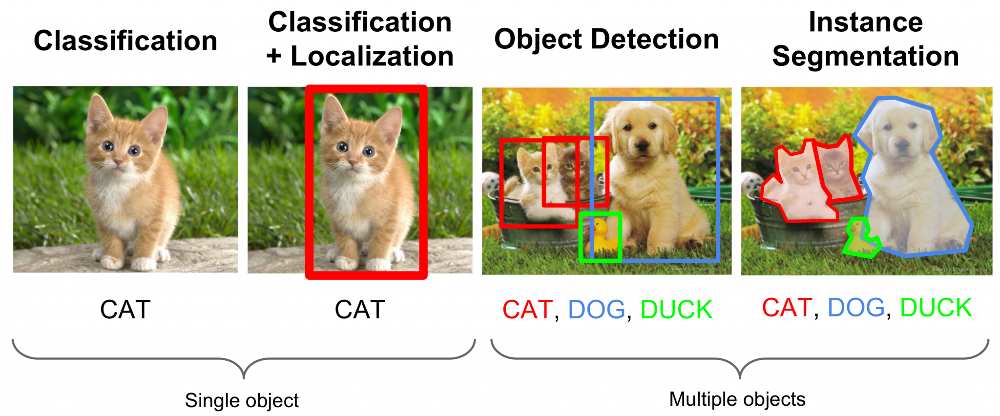